# Flight Delay Prediction (Group 99)

### Malisha A.P.D. (EG/2020/4065)
### Lelwala L.G.S.R. (EG/2020/4047)

## Importing the libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

## Importing the dataset

In [2]:
dataset = pd.read_csv('Feb_2020_ontime.csv')

## Data Pre-Processing

### Checking for missing values

In [3]:
dataset.isnull().sum()

DAY_OF_MONTH                  0
DAY_OF_WEEK                   0
OP_UNIQUE_CARRIER             0
OP_CARRIER_AIRLINE_ID         0
OP_CARRIER                    0
TAIL_NUM                    433
OP_CARRIER_FL_NUM             0
ORIGIN_AIRPORT_ID             0
ORIGIN_AIRPORT_SEQ_ID         0
ORIGIN                        0
DEST_AIRPORT_ID               0
DEST_AIRPORT_SEQ_ID           0
DEST                          0
DEP_TIME                   4938
DEP_DEL15                  4951
DEP_TIME_BLK                  0
ARR_TIME                   5287
ARR_DEL15                  6192
CANCELLED                     0
DIVERTED                      0
DISTANCE                      0
Unnamed: 21              574268
dtype: int64

<Axes: >

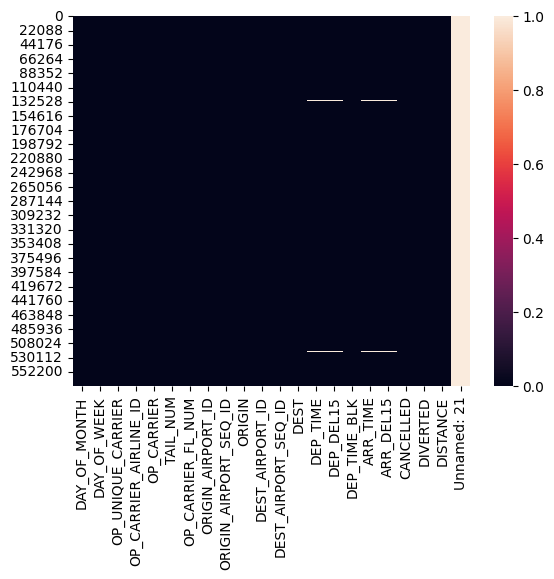

In [4]:
sns.heatmap(data=dataset.isnull())

Find number of records in dataset:

In [5]:
dataset.shape[0]

574268

Since total missing values in 'Unnamed: 21' column is equal to number of records in the dataset, we can conclude that it is an empty column.

In [6]:
dataset.drop('Unnamed: 21', axis=1, inplace=True)

In [7]:
dataset.columns.tolist()

['DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST',
 'DEP_TIME',
 'DEP_DEL15',
 'DEP_TIME_BLK',
 'ARR_TIME',
 'ARR_DEL15',
 'CANCELLED',
 'DIVERTED',
 'DISTANCE']

### Dropping 'CANCELLED' and 'DIVERTED' columns

In [8]:
dataset['CANCELLED'].value_counts()

CANCELLED
0.0    569133
1.0      5135
Name: count, dtype: int64

In [9]:
dataset['DIVERTED'].value_counts()

DIVERTED
0.0    573211
1.0      1057
Name: count, dtype: int64

Lets analyze 'DIVERTED' and 'CANCELLED' columns using Seaborn countplots

<Axes: xlabel='DIVERTED', ylabel='count'>

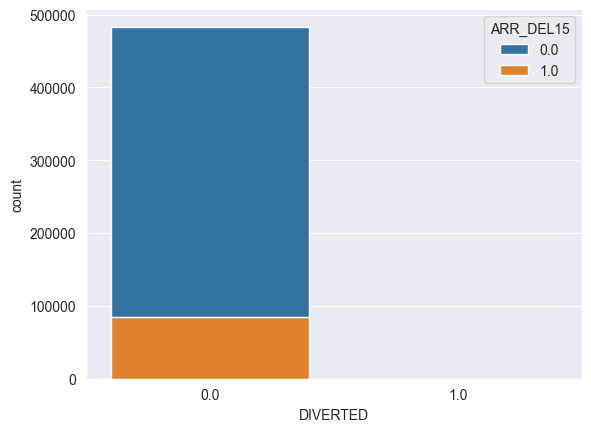

In [10]:
import seaborn as sns
sns.set_style('darkgrid')
sns.countplot(x='DIVERTED', data=dataset, hue='ARR_DEL15')

<Axes: xlabel='CANCELLED', ylabel='count'>

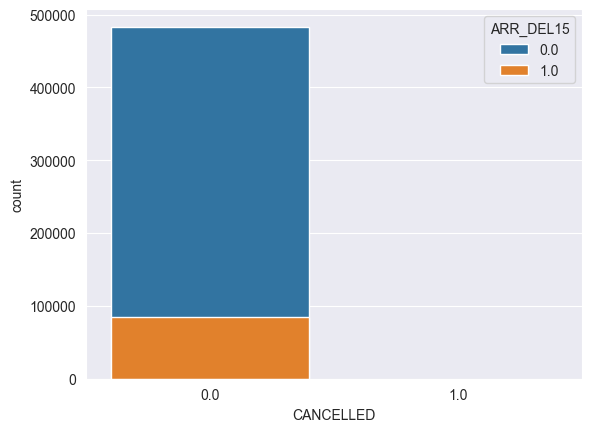

In [11]:
sns.countplot(x='CANCELLED', data=dataset, hue='ARR_DEL15')

Dropping 'DIVERTED' and 'CANCELLED' since all the flights that diverted or cancelled were not delayed

In [12]:
dataset = dataset.drop(['DIVERTED', 'CANCELLED'], axis=1)

### Remove missing values regarding label - 'ARR_DEL15'

In [13]:
dataset.dropna(subset=['ARR_DEL15'], inplace=True)

In [14]:
dataset.isnull().sum()

DAY_OF_MONTH             0
DAY_OF_WEEK              0
OP_UNIQUE_CARRIER        0
OP_CARRIER_AIRLINE_ID    0
OP_CARRIER               0
TAIL_NUM                 0
OP_CARRIER_FL_NUM        0
ORIGIN_AIRPORT_ID        0
ORIGIN_AIRPORT_SEQ_ID    0
ORIGIN                   0
DEST_AIRPORT_ID          0
DEST_AIRPORT_SEQ_ID      0
DEST                     0
DEP_TIME                 0
DEP_DEL15                0
DEP_TIME_BLK             0
ARR_TIME                 0
ARR_DEL15                0
DISTANCE                 0
dtype: int64

<Axes: >

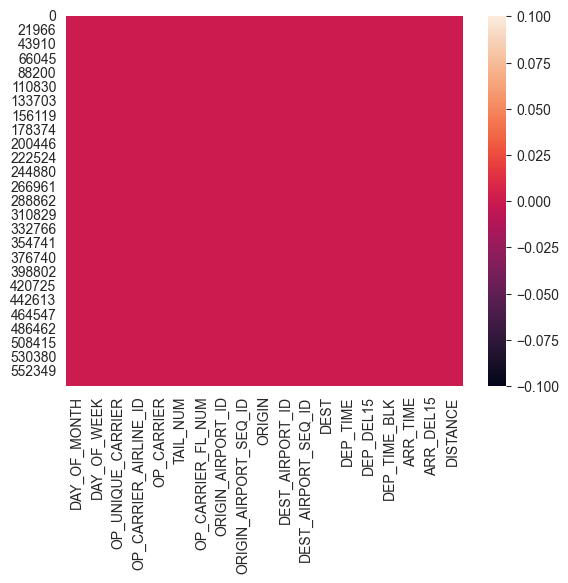

In [15]:
sns.heatmap(data=dataset.isnull())

According to the heatmap above there are no missing values in this dataset

In [16]:
dataset.shape[0]

568076

### Splitting features and label

In [17]:
dataset.head()

,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,ARR_DEL15,DISTANCE
0,1,6,MQ,20398,MQ,N269NN,3825,13930,1393007,ORD,15370,1537002,TUL,1646.0,0.0,1600-1659,1820.0,0.0,585.0
1,1,6,MQ,20398,MQ,N908AE,3829,12478,1247805,JFK,10693,1069302,BNA,1336.0,0.0,1300-1359,1458.0,0.0,765.0
2,1,6,MQ,20398,MQ,N663AR,3831,11953,1195302,GNV,13303,1330303,MIA,844.0,0.0,0800-0859,1020.0,1.0,294.0
3,1,6,MQ,20398,MQ,N618AE,3833,11298,1129806,DFW,14842,1484202,SJT,852.0,0.0,0800-0859,955.0,0.0,229.0
4,1,6,MQ,20398,MQ,N618AE,3833,14842,1484202,SJT,11298,1129806,DFW,1024.0,0.0,1000-1059,1132.0,0.0,229.0


In [18]:
dataset.columns.tolist()

['DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST',
 'DEP_TIME',
 'DEP_DEL15',
 'DEP_TIME_BLK',
 'ARR_TIME',
 'ARR_DEL15',
 'DISTANCE']

Lets split the dataset into features and label

In [19]:
X = pd.concat([
    dataset.iloc[:, 0:17],
    dataset.iloc[:, 18],  
], axis=1)

y = dataset.iloc[:, 17]

In [20]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,DISTANCE
0,1,6,MQ,20398,MQ,N269NN,3825,13930,1393007,ORD,15370,1537002,TUL,1646.0,0.0,1600-1659,1820.0,585.0
1,1,6,MQ,20398,MQ,N908AE,3829,12478,1247805,JFK,10693,1069302,BNA,1336.0,0.0,1300-1359,1458.0,765.0
2,1,6,MQ,20398,MQ,N663AR,3831,11953,1195302,GNV,13303,1330303,MIA,844.0,0.0,0800-0859,1020.0,294.0
3,1,6,MQ,20398,MQ,N618AE,3833,11298,1129806,DFW,14842,1484202,SJT,852.0,0.0,0800-0859,955.0,229.0
4,1,6,MQ,20398,MQ,N618AE,3833,14842,1484202,SJT,11298,1129806,DFW,1024.0,0.0,1000-1059,1132.0,229.0


In [21]:
X.isnull().sum()

DAY_OF_MONTH             0
DAY_OF_WEEK              0
OP_UNIQUE_CARRIER        0
OP_CARRIER_AIRLINE_ID    0
OP_CARRIER               0
TAIL_NUM                 0
OP_CARRIER_FL_NUM        0
ORIGIN_AIRPORT_ID        0
ORIGIN_AIRPORT_SEQ_ID    0
ORIGIN                   0
DEST_AIRPORT_ID          0
DEST_AIRPORT_SEQ_ID      0
DEST                     0
DEP_TIME                 0
DEP_DEL15                0
DEP_TIME_BLK             0
ARR_TIME                 0
DISTANCE                 0
dtype: int64

### Dropping other columns

We can use 'OP_UNIQUE_CARRIER' to uniquely identify an airline. So we can drop 'OP_CARRIER' and 'OP_CARRIER_AIRLINE_ID' which were also used to uniquely identify an airline. We also use 'TAIL_NUM' to uniquely identify an airplane. So we can drop 'OP_CARRIER_FL_NUM' which is used for the same purpose. 

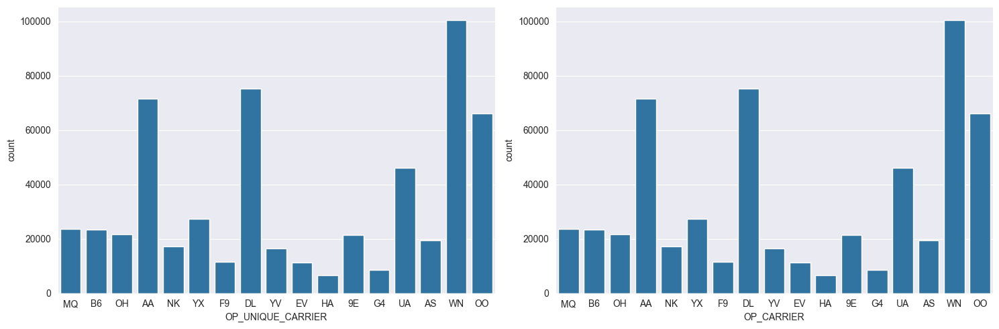

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.countplot(x='OP_UNIQUE_CARRIER', data=X, ax=axes[0])
sns.countplot(x='OP_CARRIER', data=X, ax=axes[1])
plt.tight_layout()
plt.show()

As seen below 'OP_CARRIER_AIRLINE_ID' also used to uniquely identify an airline. Analyzing by the hue of the plot below, we can see each ID is mapped to a category in 'OP_UNIQUE_CARRIER'

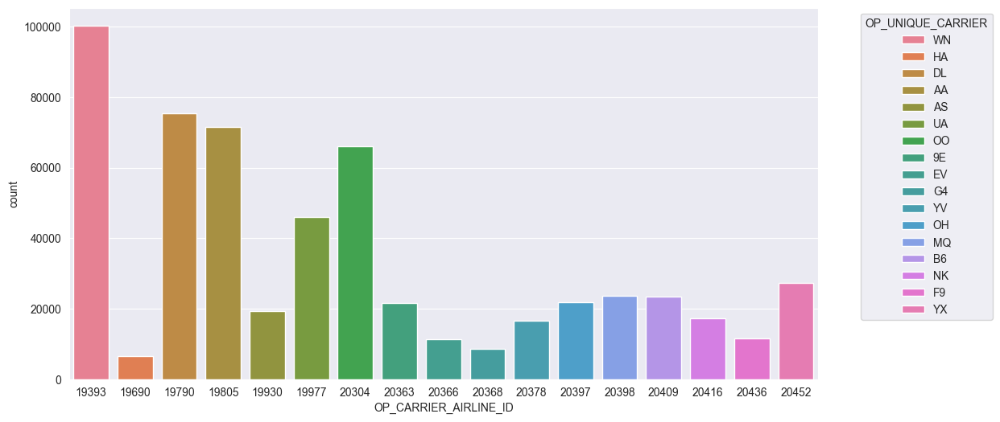

In [23]:
plt.figure(figsize=(12, 6))
sns.countplot(x='OP_CARRIER_AIRLINE_ID', data=dataset, hue='OP_UNIQUE_CARRIER')
plt.legend(title='OP_UNIQUE_CARRIER', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Lets analyze the 'ORIGIN_AIRPORT_ID' and 'ORIGIN_AIRPORT_SEQ_ID'. We can see that both columns are used for the same purpose

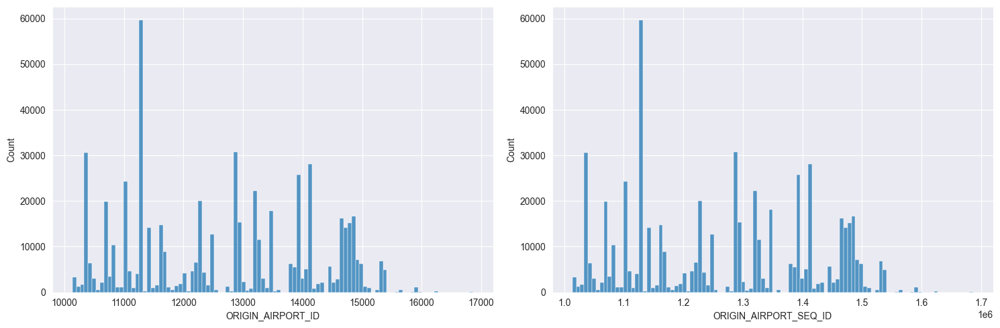

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.histplot(x='ORIGIN_AIRPORT_ID', data=X, ax=axes[0])
sns.histplot(x='ORIGIN_AIRPORT_SEQ_ID', data=X, ax=axes[1])
plt.tight_layout()
plt.show()

By analyzing the 'ORIGIN' and 'ORIGIN_AIRPORT_ID' columns we can see that they are used for same purpose. (Pandas dataframes were used for analysis)

In [25]:
unique_values_for_origin = X['ORIGIN'].value_counts()
unique_values_for_origin.reset_index()

,ORIGIN,count
0,ATL,29806
1,ORD,23903
2,DFW,22817
3,DEN,19253
4,CLT,18164
...,...,...
345,HGR,10
346,OGD,8
347,OWB,8
348,PPG,7


In [26]:
unique_values_for_origin_id = X['ORIGIN_AIRPORT_ID'].value_counts()
unique_values_for_origin_id.reset_index()

,ORIGIN_AIRPORT_ID,count
0,10397,29806
1,13930,23903
2,11298,22817
3,11292,19253
4,11057,18164
...,...,...
345,12119,10
346,13829,8
347,13983,8
348,14222,7


Lets analyze the 'DEST_AIRPORT_ID' and 'DEST_AIRPORT_SEQ_ID'. We can see that both columns are used for the same purpose

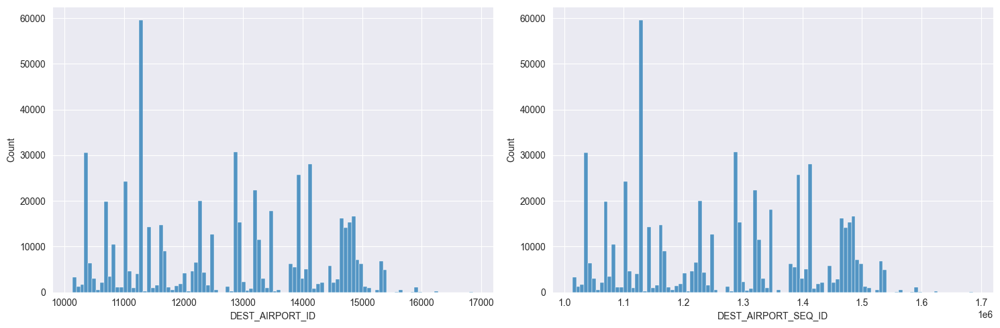

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.histplot(x='DEST_AIRPORT_ID', data=X, ax=axes[0])
sns.histplot(x='DEST_AIRPORT_SEQ_ID', data=X, ax=axes[1])
plt.tight_layout()
plt.show()

By analyzing the 'DEST' and 'DEST_AIRPORT_ID' columns we can see that they are used for same purpose. (Pandas dataframes were used for analysis)

In [28]:
unique_values_for_dest = X['DEST'].value_counts()
unique_values_for_dest.reset_index()

,DEST,count
0,ATL,29806
1,ORD,23923
2,DFW,22803
3,DEN,19244
4,CLT,18098
...,...,...
345,HGR,10
346,OWB,8
347,OGD,8
348,PPG,7


In [29]:
unique_values_for_dest_id = X['DEST_AIRPORT_ID'].value_counts()
unique_values_for_dest_id.reset_index()

,DEST_AIRPORT_ID,count
0,10397,29806
1,13930,23923
2,11298,22803
3,11292,19244
4,11057,18098
...,...,...
345,12119,10
346,13983,8
347,13829,8
348,14222,7


We decided to use Tail Number instead of Flight Number for this model.(Since tail number uniquely identify a flight while flight number is virtually assigned and used for booking purposes) So we decided to drop 'OP_CARRIER_FL_NUM' and keep 'TAIL_NUM'. 

Lets drop the relevant columns

In [30]:
X = X.drop(['OP_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'ORIGIN_AIRPORT_SEQ_ID', 'DEST_AIRPORT_ID', 'DEST_AIRPORT_SEQ_ID'], axis=1)

In [31]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,DISTANCE
0,1,6,MQ,N269NN,ORD,TUL,1646.0,0.0,1600-1659,1820.0,585.0
1,1,6,MQ,N908AE,JFK,BNA,1336.0,0.0,1300-1359,1458.0,765.0
2,1,6,MQ,N663AR,GNV,MIA,844.0,0.0,0800-0859,1020.0,294.0
3,1,6,MQ,N618AE,DFW,SJT,852.0,0.0,0800-0859,955.0,229.0
4,1,6,MQ,N618AE,SJT,DFW,1024.0,0.0,1000-1059,1132.0,229.0


### Checking for outliers

Checking for outliers in 'DAY_OF_MONTH' and 'DAY_OF_WEEK' columns

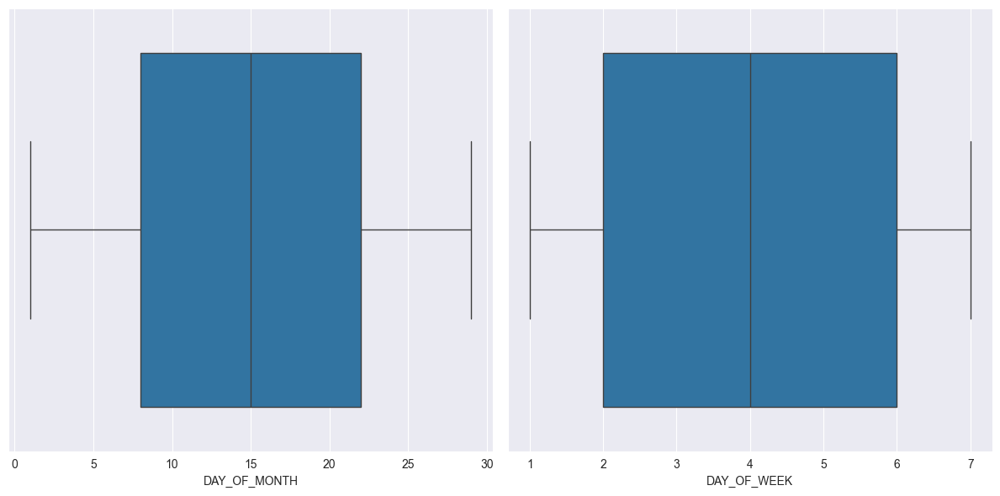

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(x=X['DAY_OF_MONTH'], ax=axes[0])
sns.boxplot(x=X['DAY_OF_WEEK'], ax=axes[1])
plt.tight_layout()
plt.show()

Checking for outliers in 'DISTANCE' column

<Axes: xlabel='DISTANCE'>

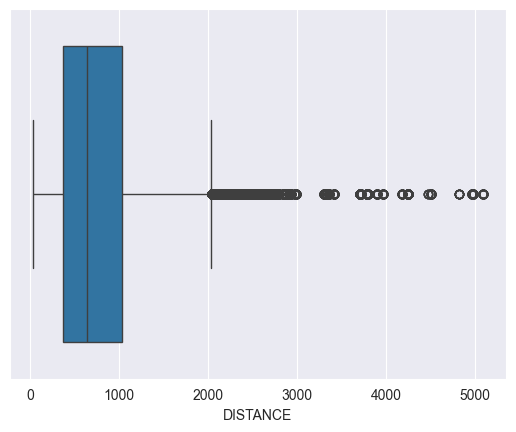

In [33]:
sns.boxplot(x=X['DISTANCE'])

In [34]:
Q1 = X['DISTANCE'].quantile(0.25)
Q3 = X['DISTANCE'].quantile(0.75)

# Calculate the IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = (X['DISTANCE'] < lower_bound) | (X['DISTANCE'] > upper_bound)

# Count the number of outliers
num_outliers = outliers.sum()
print(f'Number of outliers: {num_outliers}')

Number of outliers: 31034


In [35]:
# Calculate the percentage of outliers
percentage_outliers = (num_outliers / len(X)) * 100
print(f'Percentage of outliers: {percentage_outliers:.2f}%')

Percentage of outliers: 5.46%


We decided to Winsorize the outliers of distance column after splitting the dataset into training set and test set. Otherwise it may cause information leakage between two sets

Checking for outliers in 'DEP_TIME' and 'ARR_TIME' columns

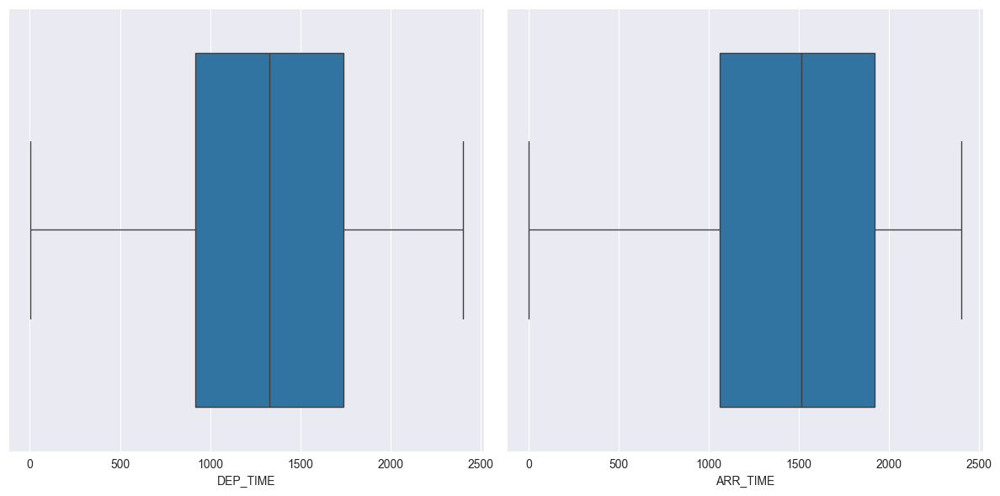

In [36]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(x=X['DEP_TIME'], ax=axes[0])
sns.boxplot(x=X['ARR_TIME'], ax=axes[1])
plt.tight_layout()
plt.show()

## Encoding categorical data

### One hot encoding OP_UNIQUE_CARRIER

In [37]:
from sklearn.preprocessing import OneHotEncoder

# Instantiate the OneHotEncoder
encoder = OneHotEncoder(sparse=False)

# Fit and transform the 'ORIGIN' column
one_hot = encoder.fit_transform(X[['OP_UNIQUE_CARRIER']])

categories = X['OP_UNIQUE_CARRIER'].unique()

# Generate the feature names
feature_names = ['OP_UNIQUE_CARRIER_' + str(category) for category in categories]

# Convert the one-hot encoded features to a DataFrame
one_hot_df = pd.DataFrame(one_hot, columns=feature_names)

# Reset the index of the original DataFrame for the concatenation
X.reset_index(drop=True, inplace=True)

# Concatenate the original DataFrame with the one-hot encoded DataFrame
X = pd.concat([X, one_hot_df], axis=1)

# drop the original 'ORIGIN' column
X = X.drop('OP_UNIQUE_CARRIER', axis=1)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [38]:
X.describe()

,DAY_OF_MONTH,DAY_OF_WEEK,DEP_TIME,DEP_DEL15,ARR_TIME,DISTANCE,OP_UNIQUE_CARRIER_MQ,OP_UNIQUE_CARRIER_B6,OP_UNIQUE_CARRIER_OH,OP_UNIQUE_CARRIER_AA,...,OP_UNIQUE_CARRIER_DL,OP_UNIQUE_CARRIER_YV,OP_UNIQUE_CARRIER_EV,OP_UNIQUE_CARRIER_HA,OP_UNIQUE_CARRIER_9E,OP_UNIQUE_CARRIER_G4,OP_UNIQUE_CARRIER_UA,OP_UNIQUE_CARRIER_AS,OP_UNIQUE_CARRIER_WN,OP_UNIQUE_CARRIER_OO
count,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,...,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000,568076.000000
mean,15.224878,3.987729,1332.895933,0.144007,1478.724046,797.826166,0.037844,0.125999,0.033976,0.041274,...,0.015255,0.011398,0.041732,0.030417,0.038299,0.116189,0.081104,0.176667,0.029133,0.048057
std,8.299185,1.991361,498.548517,0.351097,527.613473,583.708649,0.190818,0.331849,0.181168,0.198924,...,0.122566,0.106152,0.199976,0.171731,0.191918,0.320451,0.272994,0.381387,0.168181,0.213887
min,1.000000,1.000000,1.000000,0.000000,1.000000,31.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,2.000000,918.000000,0.000000,1058.000000,369.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,15.000000,4.000000,1328.000000,0.000000,1513.000000,642.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,22.000000,6.000000,1741.000000,0.000000,1920.000000,1041.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,29.000000,7.000000,2400.000000,1.000000,2400.000000,5095.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [39]:
X['OP_UNIQUE_CARRIER_UA'].nunique()

2

In [40]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568076 entries, 0 to 568075
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   DAY_OF_MONTH          568076 non-null  int64  
 1   DAY_OF_WEEK           568076 non-null  int64  
 2   TAIL_NUM              568076 non-null  object 
 3   ORIGIN                568076 non-null  object 
 4   DEST                  568076 non-null  object 
 5   DEP_TIME              568076 non-null  float64
 6   DEP_DEL15             568076 non-null  float64
 7   DEP_TIME_BLK          568076 non-null  object 
 8   ARR_TIME              568076 non-null  float64
 9   DISTANCE              568076 non-null  float64
 10  OP_UNIQUE_CARRIER_MQ  568076 non-null  float64
 11  OP_UNIQUE_CARRIER_B6  568076 non-null  float64
 12  OP_UNIQUE_CARRIER_OH  568076 non-null  float64
 13  OP_UNIQUE_CARRIER_AA  568076 non-null  float64
 14  OP_UNIQUE_CARRIER_NK  568076 non-null  float64
 15  

### Function for calculating arrival time block

Dealing with time is a huge challenge in this dataset. There is already a column named 'DEP_TIME_BLK' in this dataset for dividing departure time of flights into hourly blocks. So we decided to create a new column for Arrival time block. Python function for calculating the arrival time block for a given arrival time is defined below.

In [41]:
def arr_time(x):

  if x >= 600 and x <= 659:
    return '0600-0659'
  elif x>=1400 and x<=1459:
    return '1400-1459'
  elif x>=1200 and x<=1259:
    return '1200-1259'
  elif x>=1500 and x<=1559:
    return '1500-1559'
  elif x>=1900 and x<=1959:
    return '1900-1959'
  elif x>=900 and x<=959:
    return '0900-0959'
  elif x>=1000 and x<=1059:
    return  '1000-1059'
  elif x>=2000 and x<=2059:
    return '2000-2059'
  elif x>=1300 and x<=1359:
    return '1300-1359'
  elif x>=1100 and x<=1159:
    return '1100-1159'
  elif x>=800 and x<=859:
    return '0800-0859'
  elif x>=2200 and x<=2259:
    return '2200-2259'
  elif x>=1600 and x<=1659:
    return '1600-1659'
  elif x>=1700 and x<=1759:
    return '1700-1759'
  elif x>=2100 and x<=2159:
    return '2100-2159'
  elif x>=700 and x<=759:
    return '0700-0759'
  elif x>=1800 and x<=1859:
    return '1800-1859'
  elif x>=1 and x<=559:
    return '0001-0559'
  elif x>=2300 and x<=2400:
    return '2300-2400'

### Create a new feature for the arrival time block

In [42]:
# applying arr_time() function for 'ARR_TIME' value in each row
X['ARR_TIME_BLK'] = X['ARR_TIME'].apply(lambda x :arr_time(x))
X.reset_index(inplace=True)
X.head()

,index,DAY_OF_MONTH,DAY_OF_WEEK,TAIL_NUM,ORIGIN,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,...,OP_UNIQUE_CARRIER_YV,OP_UNIQUE_CARRIER_EV,OP_UNIQUE_CARRIER_HA,OP_UNIQUE_CARRIER_9E,OP_UNIQUE_CARRIER_G4,OP_UNIQUE_CARRIER_UA,OP_UNIQUE_CARRIER_AS,OP_UNIQUE_CARRIER_WN,OP_UNIQUE_CARRIER_OO,ARR_TIME_BLK
0,0,1,6,N269NN,ORD,TUL,1646.0,0.0,1600-1659,1820.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1800-1859
1,1,1,6,N908AE,JFK,BNA,1336.0,0.0,1300-1359,1458.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1400-1459
2,2,1,6,N663AR,GNV,MIA,844.0,0.0,0800-0859,1020.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000-1059
3,3,1,6,N618AE,DFW,SJT,852.0,0.0,0800-0859,955.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0900-0959
4,4,1,6,N618AE,SJT,DFW,1024.0,0.0,1000-1059,1132.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1100-1159


In [43]:
print(X.ARR_TIME_BLK.nunique())
print(X.DEP_TIME_BLK.nunique())

19
19


Lets drop original departure and arrival time columns since we instead using hourly time blocks for arrival and departure time

In [44]:
X = X.drop(['DEP_TIME', 'ARR_TIME', 'index'], axis=1)

In [45]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,TAIL_NUM,ORIGIN,DEST,DEP_DEL15,DEP_TIME_BLK,DISTANCE,OP_UNIQUE_CARRIER_MQ,OP_UNIQUE_CARRIER_B6,...,OP_UNIQUE_CARRIER_YV,OP_UNIQUE_CARRIER_EV,OP_UNIQUE_CARRIER_HA,OP_UNIQUE_CARRIER_9E,OP_UNIQUE_CARRIER_G4,OP_UNIQUE_CARRIER_UA,OP_UNIQUE_CARRIER_AS,OP_UNIQUE_CARRIER_WN,OP_UNIQUE_CARRIER_OO,ARR_TIME_BLK
0,1,6,N269NN,ORD,TUL,0.0,1600-1659,585.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1800-1859
1,1,6,N908AE,JFK,BNA,0.0,1300-1359,765.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1400-1459
2,1,6,N663AR,GNV,MIA,0.0,0800-0859,294.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000-1059
3,1,6,N618AE,DFW,SJT,0.0,0800-0859,229.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0900-0959
4,1,6,N618AE,SJT,DFW,0.0,1000-1059,229.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1100-1159


Though we used one hot encoding to encode unique carriers, since it add many dimensions to the dataset, we decided to use hash encoding using sklearn.feature_extraction.FeatureHasher to encode remaining categorical data.

### Hash encoding 'TAIL_NUM'

In [46]:
from sklearn.feature_extraction import FeatureHasher

X['TAIL_NUM'] = X['TAIL_NUM'].astype(str)

hasher = FeatureHasher(n_features=10, input_type='string')
hashed_tail_num = hasher.transform(X['TAIL_NUM'].apply(lambda x: [x]))
hashed_df_tail_num = pd.DataFrame(hashed_tail_num.toarray())

In [47]:
# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_tail_num], axis=1)

# drop the original 'OP_UNIQUE_CARRIER' column
X = X.drop('TAIL_NUM', axis=1)

In [48]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,ORIGIN,DEST,DEP_DEL15,DEP_TIME_BLK,DISTANCE,OP_UNIQUE_CARRIER_MQ,OP_UNIQUE_CARRIER_B6,OP_UNIQUE_CARRIER_OH,...,0,1,2,3,4,5,6,7,8,9
0,1,6,ORD,TUL,0.0,1600-1659,585.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,6,JFK,BNA,0.0,1300-1359,765.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0
2,1,6,GNV,MIA,0.0,0800-0859,294.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1,6,DFW,SJT,0.0,0800-0859,229.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,6,SJT,DFW,0.0,1000-1059,229.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Hash encoding ORIGIN and DEST

In [49]:
X['ORIGIN'] = X['ORIGIN'].astype(str)

hasher_origin = FeatureHasher(n_features=10, input_type='string')
hashed_origin = hasher_origin.transform(X['ORIGIN'].apply(lambda x: [x]))
hashed_df_origin = pd.DataFrame(hashed_origin.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_origin], axis=1)

# drop the original 'ORIGIN' column
X = X.drop('ORIGIN', axis=1)

In [50]:
X['DEST'] = X['DEST'].astype(str)

hasher_dest = FeatureHasher(n_features=10, input_type='string')
hashed_dest = hasher_dest.transform(X['DEST'].apply(lambda x: [x]))
hashed_df_dest = pd.DataFrame(hashed_dest.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_dest], axis=1)

# Drop the original 'DEST' column
X = X.drop('DEST', axis=1)

In [51]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DEP_TIME_BLK,DISTANCE,OP_UNIQUE_CARRIER_MQ,OP_UNIQUE_CARRIER_B6,OP_UNIQUE_CARRIER_OH,OP_UNIQUE_CARRIER_AA,OP_UNIQUE_CARRIER_NK,...,0,1,2,3,4,5,6,7,8,9
0,1,6,0.0,1600-1659,585.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,6,0.0,1300-1359,765.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,6,0.0,0800-0859,294.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,6,0.0,0800-0859,229.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,6,0.0,1000-1059,229.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0


In [52]:
X.columns

Index([        'DAY_OF_MONTH',          'DAY_OF_WEEK',            'DEP_DEL15',
               'DEP_TIME_BLK',             'DISTANCE', 'OP_UNIQUE_CARRIER_MQ',
       'OP_UNIQUE_CARRIER_B6', 'OP_UNIQUE_CARRIER_OH', 'OP_UNIQUE_CARRIER_AA',
       'OP_UNIQUE_CARRIER_NK', 'OP_UNIQUE_CARRIER_YX', 'OP_UNIQUE_CARRIER_F9',
       'OP_UNIQUE_CARRIER_DL', 'OP_UNIQUE_CARRIER_YV', 'OP_UNIQUE_CARRIER_EV',
       'OP_UNIQUE_CARRIER_HA', 'OP_UNIQUE_CARRIER_9E', 'OP_UNIQUE_CARRIER_G4',
       'OP_UNIQUE_CARRIER_UA', 'OP_UNIQUE_CARRIER_AS', 'OP_UNIQUE_CARRIER_WN',
       'OP_UNIQUE_CARRIER_OO',         'ARR_TIME_BLK',                      0,
                            1,                      2,                      3,
                            4,                      5,                      6,
                            7,                      8,                      9,
                            0,                      1,                      2,
                            3,                      

### Hash encoding DEP_TIME_BLK and ARR_TIME_BLK

In [53]:
X['DEP_TIME_BLK'] = X['DEP_TIME_BLK'].astype(str)

hasher_dep_blk = FeatureHasher(n_features=10, input_type='string')
hashed_dep_blk = hasher_dep_blk.transform(X['DEP_TIME_BLK'].apply(lambda x: [x]))
hashed_df_dep_blk = pd.DataFrame(hashed_dep_blk.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_dep_blk], axis=1)

# drop the original column
X = X.drop('DEP_TIME_BLK', axis=1)

In [54]:
X['ARR_TIME_BLK'] = X['ARR_TIME_BLK'].astype(str)

hasher_arr_blk = FeatureHasher(n_features=10, input_type='string')
hashed_arr_blk = hasher_arr_blk.transform(X['ARR_TIME_BLK'].apply(lambda x: [x]))
hashed_df_arr_blk = pd.DataFrame(hashed_arr_blk.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_arr_blk], axis=1)

# drop the original column
X = X.drop('ARR_TIME_BLK', axis=1)

In [55]:
X.columns = X.columns.astype(str)

In [56]:
X.isnull().sum()

DAY_OF_MONTH            0
DAY_OF_WEEK             0
DEP_DEL15               0
DISTANCE                0
OP_UNIQUE_CARRIER_MQ    0
                       ..
5                       0
6                       0
7                       0
8                       0
9                       0
Length: 71, dtype: int64

### Encoding DAY_OF_MONTH and DAY_OF_WEEK

In [57]:
X.head()

,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DISTANCE,OP_UNIQUE_CARRIER_MQ,OP_UNIQUE_CARRIER_B6,OP_UNIQUE_CARRIER_OH,OP_UNIQUE_CARRIER_AA,OP_UNIQUE_CARRIER_NK,OP_UNIQUE_CARRIER_YX,...,0,1,2,3,4,5,6,7,8,9
0,1,6,0.0,585.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0
1,1,6,0.0,765.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,6,0.0,294.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0
3,1,6,0.0,229.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,6,0.0,229.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [58]:
X['DAY_OF_WEEK'] = X['DAY_OF_WEEK'].astype(str)

hasher_dow = FeatureHasher(n_features=10, input_type='string')
hashed_dow = hasher_dow.transform(X['DAY_OF_WEEK'].apply(lambda x: [x]))
hashed_df_dow = pd.DataFrame(hashed_dow.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_dow], axis=1)

# drop the original column
X = X.drop('DAY_OF_WEEK', axis=1)

In [59]:
X['DAY_OF_MONTH'] = X['DAY_OF_MONTH'].astype(str)

hasher_dom = FeatureHasher(n_features=10, input_type='string')
hashed_dom = hasher_dom.transform(X['DAY_OF_MONTH'].apply(lambda x: [x]))
hashed_df_dom = pd.DataFrame(hashed_dom.toarray())

# Concatenate the original DataFrame with the hashed DataFrame
X = pd.concat([X, hashed_df_dom], axis=1)

# drop the original column
X = X.drop('DAY_OF_MONTH', axis=1)

In [60]:
X.columns = X.columns.astype(str)

## Correlation matrix

Hash encoding increased the dimensions significantly. Those features are considered in below correlation matrix

In [61]:
plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(X.corr(), annot = True, fmt = '.2f')

<Axes: >

## Splitting the dataset into training set and test set

In [62]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 7)

### Handling outliers for Distance column

In [63]:
df_X_train = pd.DataFrame(X_train)

In [64]:
df_X_test = pd.DataFrame(X_test)

In [65]:
df_X_train['DISTANCE']

199835     674.0
454957     377.0
40446      250.0
166339    1237.0
408192    1185.0
           ...  
315737     689.0
79463      373.0
328599    1199.0
535030     643.0
189636     304.0
Name: DISTANCE, Length: 397653, dtype: float64

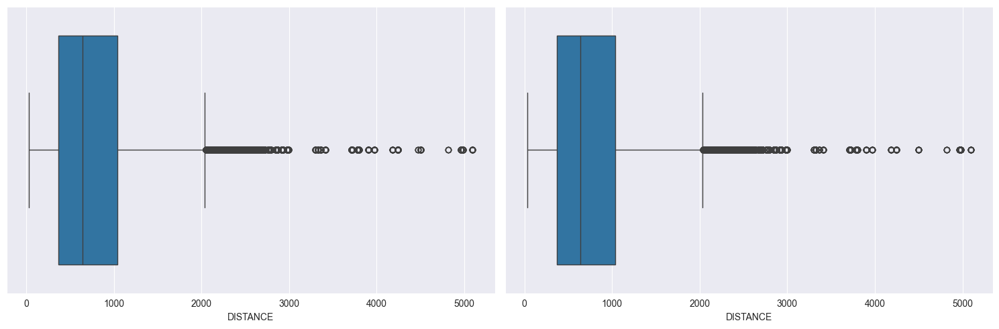

In [66]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.boxplot(x=df_X_train['DISTANCE'], ax=axes[0])
sns.boxplot(x=df_X_test['DISTANCE'], ax=axes[1])
plt.tight_layout()
plt.show()

#### Winsorize the outliers of distance column using clip function in Pandas library (training set)

In [67]:
Q1 = df_X_train['DISTANCE'].quantile(0.25)
Q3 = df_X_train['DISTANCE'].quantile(0.75)

# Calculate the IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = (df_X_train['DISTANCE'] < lower_bound) | (df_X_train['DISTANCE'] > upper_bound)

# Count the number of outliers
num_outliers = outliers.sum()
print(f'Number of outliers: {num_outliers}')

Number of outliers: 21672


In [68]:
# Calculate the percentage of outliers
percentage_outliers = (num_outliers / len(X)) * 100
print(f'Percentage of outliers: {percentage_outliers:.2f}%')

Percentage of outliers: 3.81%


In [69]:
# Set the percentile thresholds for Winsorizing
lower_percentile = 5
upper_percentile = 95

# Determine the lower and upper bounds
lower_bound = np.percentile(df_X_train['DISTANCE'], lower_percentile)
upper_bound = np.percentile(df_X_train['DISTANCE'], upper_percentile)

In [70]:
# Winsorize the data and replace the original column
df_X_train['DISTANCE'] = df_X_train['DISTANCE'].clip(lower=lower_bound, upper=upper_bound)

<Axes: xlabel='DISTANCE'>

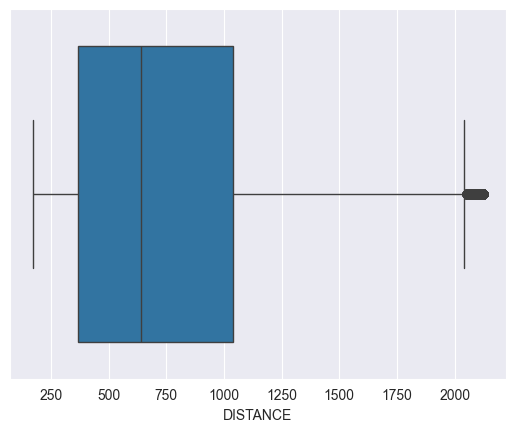

In [71]:
sns.boxplot(x=df_X_train['DISTANCE'])

#### Winsorize the outliers of distance column using clip function in Pandas library (test set)

In [72]:
Q1 = df_X_test['DISTANCE'].quantile(0.25)
Q3 = df_X_test['DISTANCE'].quantile(0.75)

# Calculate the IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = (df_X_test['DISTANCE'] < lower_bound) | (df_X_test['DISTANCE'] > upper_bound)

# Count the number of outliers
num_outliers = outliers.sum()
print(f'Number of outliers: {num_outliers}')

Number of outliers: 9411


In [73]:
# Calculate the percentage of outliers
percentage_outliers = (num_outliers / len(X)) * 100
print(f'Percentage of outliers: {percentage_outliers:.2f}%')

Percentage of outliers: 1.66%


In [74]:
# Set the percentile thresholds for Winsorizing
lower_percentile = 5
upper_percentile = 95

# Determine the lower and upper bounds
lower_bound = np.percentile(df_X_test['DISTANCE'], lower_percentile)
upper_bound = np.percentile(df_X_test['DISTANCE'], upper_percentile)

In [75]:
# Winsorize the data and replace the original column
df_X_test['DISTANCE'] = df_X_test['DISTANCE'].clip(lower=lower_bound, upper=upper_bound)

<Axes: xlabel='DISTANCE'>

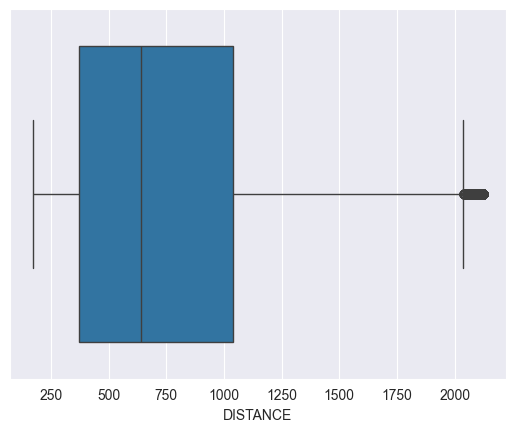

In [76]:
sns.boxplot(x=df_X_test['DISTANCE'])

#### Convert dataframes of training set and test set back to numpy array

In [77]:
X_train = df_X_train.values
X_test = df_X_test.values

## Feature Scaling

We decided to use standardization for feature scaling

In [78]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [79]:
X_train

array([[ 2.43688118, -0.20538968, -0.19826409, ...,  0.39581233,
        -0.13062528, -0.27865823],
       [-0.41036059, -0.77049649, -0.19826409, ...,  0.39581233,
        -0.13062528, -0.27865823],
       [ 2.43688118, -1.01214148,  5.04377777, ...,  0.39581233,
        -0.13062528, -0.27865823],
       ...,
       [-0.41036059,  0.79353649, -0.19826409, ...,  0.39581233,
         3.045378  , -0.27865823],
       [-0.41036059, -0.26437389, -0.19826409, ...,  0.39581233,
        -0.13062528, -0.27865823],
       [ 2.43688118, -0.90939479, -0.19826409, ...,  0.39581233,
        -0.13062528, -0.27865823]])

In [80]:
y_train

203652    1.0
460633    0.0
40625     1.0
169848    0.0
413757    0.0
         ... 
320705    0.0
80124     0.0
333617    0.0
541087    0.0
193333    1.0
Name: ARR_DEL15, Length: 397653, dtype: float64

In [81]:
y_train = y_train.astype(int)

In [82]:
y_train

203652    1
460633    0
40625     1
169848    0
413757    0
         ..
320705    0
80124     0
333617    0
541087    0
193333    1
Name: ARR_DEL15, Length: 397653, dtype: int32

## Applying LDA

We decided to use Linear Discriminant Analysis for dimensionality reduction

In [83]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA()
X_train = lda.fit_transform(X_train, y_train)
X_test = lda.transform(X_test)

In [84]:
X_train

array([[ 3.43319826],
       [-0.86846949],
       [ 3.66347374],
       ...,
       [-0.12443979],
       [-0.86320153],
       [ 3.5451288 ]])

In [85]:
X_train.shape

(397653, 1)

In [86]:
y_train.shape

(397653,)

## Applying SMOTE

In [87]:
np.bincount(y_train)

array([338420,  59233], dtype=int64)

There are small number of samples for label '1' compared with label '0'. So we decided to use SMOTE oversampling to generate additional data for label '1'

In [88]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [89]:
np.bincount(y_res)

array([338420, 338420], dtype=int64)

## Training the Model (K-Nearest Neighbors)

We decided to use grid search for parameter tuning. We used the best estimator returned by the GridSearchCV class as our model

In [90]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_neighbors': [3, 5, 7, 9],  # number of neighbors
    'weights': ['uniform', 'distance'],  # Different weight options
    'p': [1, 2]  # Power parameter for distance (1 for Manhattan, 2 for Euclidean)
}

grid_search = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_res, y_res)

# Get the best estimator
classifier_knn = grid_search.best_estimator_

In [91]:
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


## Predicting test set for k-NN

In [92]:
y_test = y_test.astype(int)

In [93]:
y_pred_knn = classifier_knn.predict(X_test)

## Confusion Matrix and Accuracy Score for k-NN

In [94]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_train = y_train.astype(int)
cm_knn = confusion_matrix(y_test, y_pred_knn)
print(cm_knn)
accuracy_score(y_test, y_pred_knn)

[[129875  15165]
 [  5516  19867]]


0.8786490086431996

Text(50.722222222222214, 0.5, 'Actual Value')

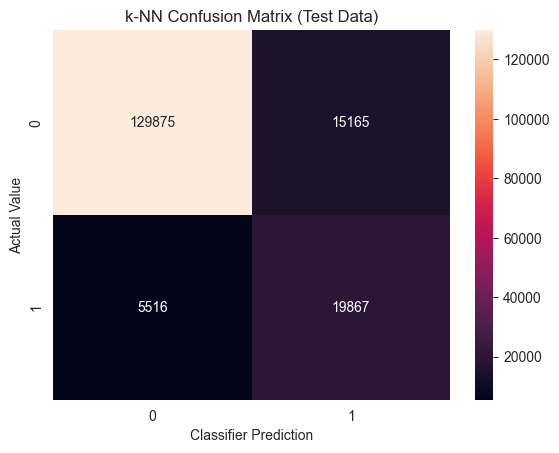

In [95]:
sns.heatmap(cm_knn, annot=True, fmt="d")
plt.title('k-NN Confusion Matrix (Test Data)')
plt.xlabel('Classifier Prediction')
plt.ylabel('Actual Value')

In [96]:
y_train_pred_knn = classifier_knn.predict(X_train)

In [97]:
cm2_knn = confusion_matrix(y_train, y_train_pred_knn)
print(cm2_knn)
accuracy_score(y_train, y_train_pred_knn)

[[309162  29258]
 [  9497  49736]]


0.9025406573067474

Text(50.722222222222214, 0.5, 'Actual Value')

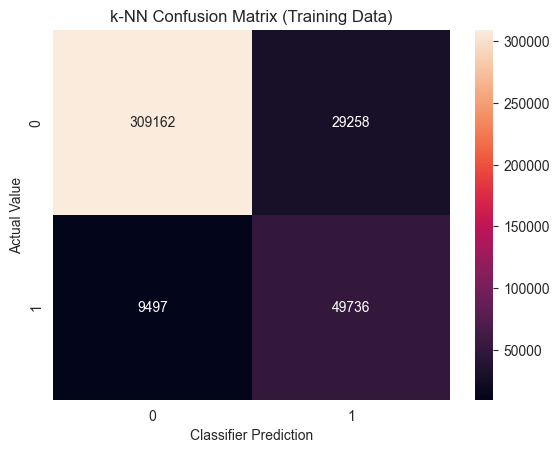

In [98]:
sns.heatmap(cm2_knn, annot=True, fmt="d")
plt.title('k-NN Confusion Matrix (Training Data)')
plt.xlabel('Classifier Prediction')
plt.ylabel('Actual Value')

## Classification Report and Other metrics for k-NN

In [99]:
from sklearn.metrics import classification_report

report_knn = classification_report(y_test, y_pred_knn)
print(report_knn)

              precision    recall  f1-score   support

           0       0.96      0.90      0.93    145040
           1       0.57      0.78      0.66     25383

    accuracy                           0.88    170423
   macro avg       0.76      0.84      0.79    170423
weighted avg       0.90      0.88      0.89    170423



In [100]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

accuracy_knn = accuracy_score(y_test, y_pred_knn)
precision_knn = precision_score(y_test, y_pred_knn)
recall_knn = recall_score(y_test, y_pred_knn)
f1_knn = f1_score(y_test, y_pred_knn)

print(f'Accuracy: {accuracy_knn:.4f}')
print(f'Precision: {precision_knn:.4f}')
print(f'Recall: {recall_knn:.4f}')
print(f'F1 Score: {f1_knn:.4f}')

Accuracy: 0.8786
Precision: 0.5671
Recall: 0.7827
F1 Score: 0.6577


Plotting the ROC curve for knn

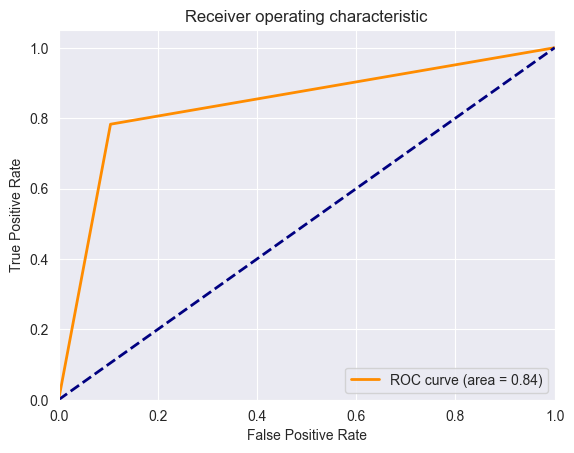

In [101]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


fpr, tpr, thresholds = roc_curve(y_test, y_pred_knn)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## K-fold cross validation for k-NN

In [102]:
from sklearn.model_selection import KFold

# number of folds = 10
kf_knn = KFold(n_splits=10, shuffle=True, random_state=42)

In [103]:
from sklearn.model_selection import cross_val_score
from sklearn.base import clone

model_knn = clone(classifier_knn)
cv_scores_knn = cross_val_score(model_knn, X_train, y_train, cv=kf_knn)

In [104]:
print("Cross-Validation Scores :", cv_scores_knn)
print("Mean Accuracy:", cv_scores_knn.mean())

Cross-Validation Scores : [0.92697279 0.92310014 0.92727456 0.92702125 0.92505973 0.9236766
 0.92644285 0.92488369 0.92697095 0.92659374]
Mean Accuracy: 0.9257996294543371


## Training the Model (SVM)

We decided to use grid search for parameter tuning. We used the best estimator returned by the GridSearchCV class as our model

In [105]:
from sklearn.model_selection import ShuffleSplit
cv = ShuffleSplit(n_splits=10, test_size=0.1, train_size=0.1, random_state=0)

In [106]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC

param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'loss': ['hinge', 'squared_hinge'],  # Loss function
    'max_iter': [1000, 2000, 3000]  # Maximum number of iterations
}
grid = GridSearchCV(LinearSVC(), param_grid, cv=cv)

In [107]:
grid.fit(X_train, y_train)

# get the best estimator
classifier_svm = grid.best_estimator_

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-pa

In [108]:
print("Best Hyperparameters:", grid.best_params_)

Best Hyperparameters: {'C': 0.1, 'loss': 'hinge', 'max_iter': 1000}


## Predicting test set (SVM)

In [109]:
y_pred_svm = classifier_svm.predict(X_test)

## Confusion Matrix and Accuracy Score (SVM)

In [110]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_train = y_train.astype(int)
cm_svm = confusion_matrix(y_test, y_pred_svm)
print(cm_svm)
accuracy_score(y_test, y_pred_svm)

[[139608   5432]
 [  6320  19063]]


0.9310421715378793

Text(50.722222222222214, 0.5, 'Actual Value')

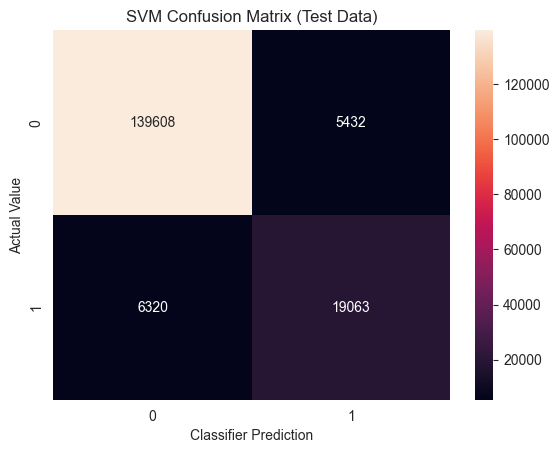

In [111]:
sns.heatmap(cm_svm, annot=True, fmt="d")
plt.title('SVM Confusion Matrix (Test Data)')
plt.xlabel('Classifier Prediction')
plt.ylabel('Actual Value')

In [112]:
y_train_pred_svm = classifier_svm.predict(X_train)

In [113]:
cm2_svm = confusion_matrix(y_train, y_train_pred_svm)
print(cm2_svm)
accuracy_score(y_train, y_train_pred_svm)

[[325301  13119]
 [ 15040  44193]]


0.9291870047503729

Text(50.722222222222214, 0.5, 'Actual Value')

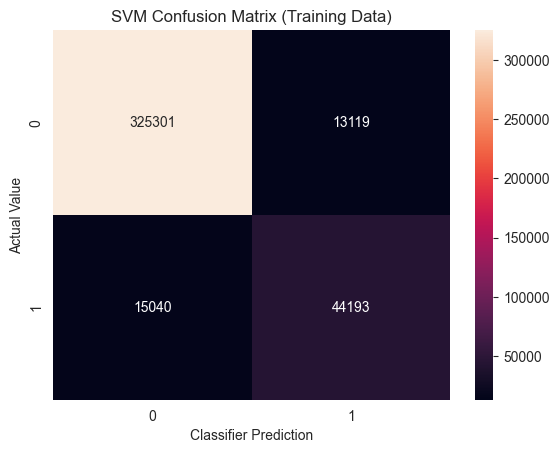

In [114]:
sns.heatmap(cm2_svm, annot=True, fmt="d")
plt.title('SVM Confusion Matrix (Training Data)')
plt.xlabel('Classifier Prediction')
plt.ylabel('Actual Value')

## Classification Report and Other metrics for SVM

In [115]:
from sklearn.metrics import classification_report

report_svm = classification_report(y_test, y_pred_svm)
print(report_svm)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96    145040
           1       0.78      0.75      0.76     25383

    accuracy                           0.93    170423
   macro avg       0.87      0.86      0.86    170423
weighted avg       0.93      0.93      0.93    170423



In [116]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm)
recall_svm = recall_score(y_test, y_pred_svm)
f1_svm = f1_score(y_test, y_pred_svm)

print(f'Accuracy: {accuracy_svm:.4f}')
print(f'Precision: {precision_svm:.4f}')
print(f'Recall: {recall_svm:.4f}')
print(f'F1 Score: {f1_svm:.4f}')

Accuracy: 0.9310
Precision: 0.7782
Recall: 0.7510
F1 Score: 0.7644


Plotting the ROC curve for SVM

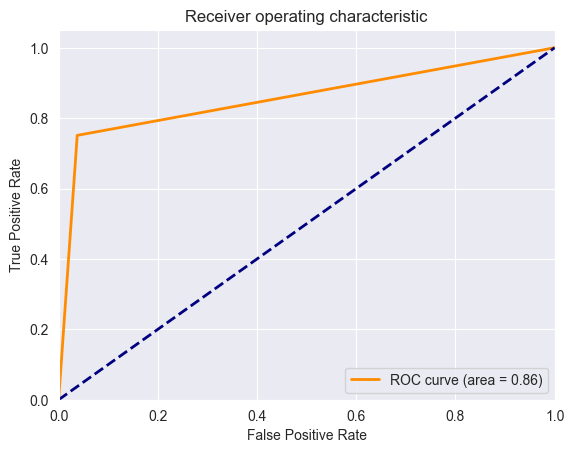

In [117]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, y_pred_svm)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## K-fold cross validation for SVM

In [118]:
from sklearn.model_selection import KFold
kf_svm = KFold(n_splits=10, shuffle=True, random_state=42)

In [119]:
from sklearn.model_selection import cross_val_score
from sklearn.base import clone

model_svm = clone(classifier_svm)
cv_scores_svm = cross_val_score(model_svm, X_train, y_train, cv=kf_svm)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-pa

In [120]:
print("Cross-Validation Scores :", cv_scores_svm)
print("Mean Accuracy:", cv_scores_svm.mean())

Cross-Validation Scores : [0.93074486 0.92624352 0.92973897 0.93001383 0.92858041 0.92742361
 0.93117063 0.92820319 0.93039105 0.92935999]
Mean Accuracy: 0.9291870068468375


## Comparison of two models

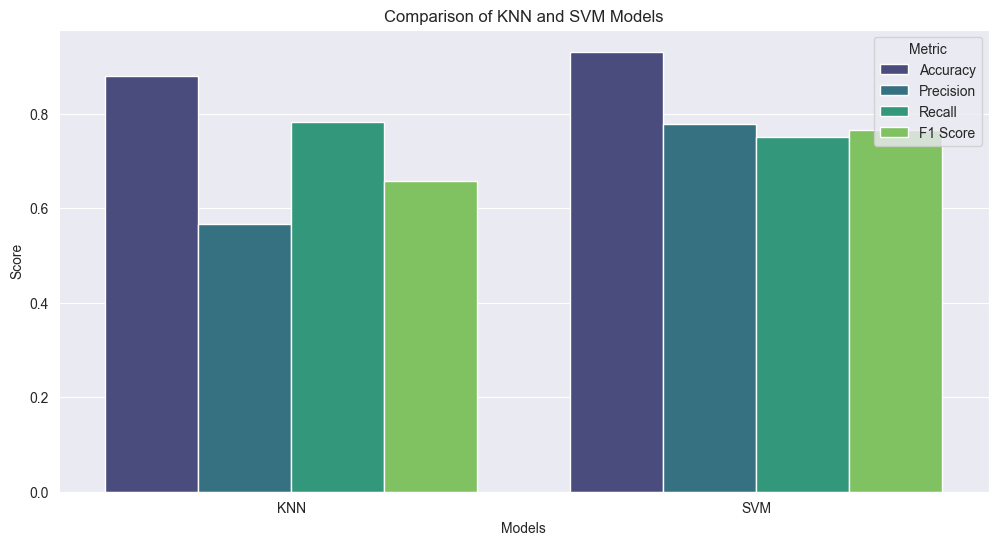

In [121]:
data = {
    'Models': ['KNN', 'SVM'],
    'Accuracy': [accuracy_knn, accuracy_svm],
    'Precision': [precision_knn, precision_svm],
    'Recall': [recall_knn, recall_svm],
    'F1 Score': [f1_knn, f1_svm]
}

df = pd.DataFrame(data)

# Melt the dataframe for better Seaborn plotting
df_melted = pd.melt(df, id_vars='Models', var_name='Metric', value_name='Score')

# Create a side-by-side bar plot using Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Models', y='Score', hue='Metric', data=df_melted, palette='viridis')
plt.title('Comparison of KNN and SVM Models')
plt.show()



As seen in the plot above we can conclude that the SVM model performs better than the k-NN model. Even though the SVM model performed better, it was slower compared with k-NN in the training phase. k-NN model was relatively slow in the testing phase compared with the SVM model. 

SMOTE overfitting had a significant impact on improving the accuracy of the k-NN model. On the other hand, SMOTE overfitting had almost no impact on the accuracy of the SVM model. So we can conclude that the SVM model was a rather 'stable model' than k-NN.